In [ ]:
!sudo apt update
!apt-get install openjdk-8-jdk-headless -qq > /dev/null
#Check this site for the latest download link https://www.apache.org/dyn/closer.lua/spark/spark-3.2.1/spark-3.2.1-bin-hadoop3.2.tgz
!wget -q https://dlcdn.apache.org/spark/spark-3.2.1/spark-3.2.1-bin-hadoop3.2.tgz
!tar xf spark-3.2.1-bin-hadoop3.2.tgz
!pip install -q findspark
!pip install pyspark
!pip install py4j

import os
import sys
# os.environ["JAVA_HOME"] = "/usr/lib/jvm/java-8-openjdk-amd64"
# os.environ["SPARK_HOME"] = "/content/spark-3.2.1-bin-hadoop3.2"


import findspark
findspark.init()
findspark.find()

import pyspark

from pyspark.sql import DataFrame, SparkSession
from typing import List
import pyspark.sql.types as T
import pyspark.sql.functions as F

spark= SparkSession \
       .builder \
       .appName("crimesInBoston") \
       .getOrCreate()

spark

Get:1 http://security.ubuntu.com/ubuntu jammy-security InRelease [129 kB]
Hit:2 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu2204/x86_64  InRelease
Hit:3 https://ppa.launchpadcontent.net/c2d4u.team/c2d4u4.0+/ubuntu jammy InRelease
Hit:4 https://ppa.launchpadcontent.net/deadsnakes/ppa/ubuntu jammy InRelease
Hit:5 https://ppa.launchpadcontent.net/graphics-drivers/ppa/ubuntu jammy InRelease
Hit:6 http://archive.ubuntu.com/ubuntu jammy InRelease
Hit:7 https://ppa.launchpadcontent.net/ubuntugis/ppa/ubuntu jammy InRelease
Get:8 https://cloud.r-project.org/bin/linux/ubuntu jammy-cran40/ InRelease [3,626 B]
Get:9 http://archive.ubuntu.com/ubuntu jammy-updates InRelease [128 kB]
Get:10 http://security.ubuntu.com/ubuntu jammy-security/restricted amd64 Packages [2,464 kB]
Hit:11 http://archive.ubuntu.com/ubuntu jammy-backports InRelease
Get:12 http://security.ubuntu.com/ubuntu jammy-security/universe amd64 Packages [1,090 kB]
Get:13 http://security.ubuntu.com/ubuntu jammy-securi

In [ ]:
spark

In [ ]:
df_crime_spark = spark.read.csv('/content/crime.csv', header=True, inferSchema=True)
df_crime_spark.show()

+---------------+------------+--------------------+--------------------+--------+--------------+--------+-------------------+----+-----+-----------+----+----------+-----------------+-----------+------------+--------------------+
|INCIDENT_NUMBER|OFFENSE_CODE|  OFFENSE_CODE_GROUP| OFFENSE_DESCRIPTION|DISTRICT|REPORTING_AREA|SHOOTING|   OCCURRED_ON_DATE|YEAR|MONTH|DAY_OF_WEEK|HOUR|  UCR_PART|           STREET|        Lat|        Long|            Location|
+---------------+------------+--------------------+--------------------+--------+--------------+--------+-------------------+----+-----+-----------+----+----------+-----------------+-----------+------------+--------------------+
|     I182070945|         619|             Larceny|  LARCENY ALL OTHERS|     D14|           808|    NULL|2018-09-02 13:00:00|2018|    9|     Sunday|  13|  Part One|       LINCOLN ST|42.35779134|-71.13937053|(42.35779134, -71...|
|     I182070943|        1402|           Vandalism|           VANDALISM|     C11|   

In [ ]:
df_codes_spark = spark.read.csv('/content/offense_codes.csv', header=True, inferSchema=True)
df_codes_spark.show()

+----+--------------------+
|CODE|                NAME|
+----+--------------------+
| 612|LARCENY PURSE SNA...|
| 613| LARCENY SHOPLIFTING|
| 615|LARCENY THEFT OF ...|
|1731|              INCEST|
|3111|LICENSE PREMISE V...|
|2646|LIQUOR - DRINKING...|
|2204|LIQUOR LAW VIOLATION|
|3810|M/V ACCIDENT - IN...|
|3801|M/V ACCIDENT - OTHER|
|3807|M/V ACCIDENT - OT...|
|3803|M/V ACCIDENT - PE...|
|3805|M/V ACCIDENT - PO...|
|3802|M/V ACCIDENT - PR...|
|3205|   M/V PLATES - LOST|
| 123|MANSLAUGHTER - NO...|
| 121|MANSLAUGHTER - VE...|
|3501|      MISSING PERSON|
|3502|MISSING PERSON - ...|
|3503|MISSING PERSON - ...|
| 111|MURDER, NON-NEGLI...|
+----+--------------------+
only showing top 20 rows



In [ ]:
df_crime_spark.printSchema()

root
 |-- INCIDENT_NUMBER: string (nullable = true)
 |-- OFFENSE_CODE: integer (nullable = true)
 |-- OFFENSE_CODE_GROUP: string (nullable = true)
 |-- OFFENSE_DESCRIPTION: string (nullable = true)
 |-- DISTRICT: string (nullable = true)
 |-- REPORTING_AREA: string (nullable = true)
 |-- SHOOTING: string (nullable = true)
 |-- OCCURRED_ON_DATE: timestamp (nullable = true)
 |-- YEAR: integer (nullable = true)
 |-- MONTH: integer (nullable = true)
 |-- DAY_OF_WEEK: string (nullable = true)
 |-- HOUR: integer (nullable = true)
 |-- UCR_PART: string (nullable = true)
 |-- STREET: string (nullable = true)
 |-- Lat: double (nullable = true)
 |-- Long: double (nullable = true)
 |-- Location: string (nullable = true)



In [ ]:
df_codes_spark.describe()

DataFrame[summary: string, CODE: string, NAME: string]

In [ ]:
df_crime_spark.describe()

DataFrame[summary: string, INCIDENT_NUMBER: string, OFFENSE_CODE: string, OFFENSE_CODE_GROUP: string, OFFENSE_DESCRIPTION: string, DISTRICT: string, REPORTING_AREA: string, SHOOTING: string, YEAR: string, MONTH: string, DAY_OF_WEEK: string, HOUR: string, UCR_PART: string, STREET: string, Lat: string, Long: string, Location: string]

In [ ]:
df_crime_spark.dtypes

[('INCIDENT_NUMBER', 'string'),
 ('OFFENSE_CODE', 'int'),
 ('OFFENSE_CODE_GROUP', 'string'),
 ('OFFENSE_DESCRIPTION', 'string'),
 ('DISTRICT', 'string'),
 ('REPORTING_AREA', 'string'),
 ('SHOOTING', 'string'),
 ('OCCURRED_ON_DATE', 'timestamp'),
 ('YEAR', 'int'),
 ('MONTH', 'int'),
 ('DAY_OF_WEEK', 'string'),
 ('HOUR', 'int'),
 ('UCR_PART', 'string'),
 ('STREET', 'string'),
 ('Lat', 'double'),
 ('Long', 'double'),
 ('Location', 'string')]

In [ ]:
df_crime_spark.describe().show()

+-------+---------------+------------------+------------------+--------------------+--------+------------------+--------+------------------+------------------+-----------+------------------+--------+-----------+-----------------+------------------+--------------------+
|summary|INCIDENT_NUMBER|      OFFENSE_CODE|OFFENSE_CODE_GROUP| OFFENSE_DESCRIPTION|DISTRICT|    REPORTING_AREA|SHOOTING|              YEAR|             MONTH|DAY_OF_WEEK|              HOUR|UCR_PART|     STREET|              Lat|              Long|            Location|
+-------+---------------+------------------+------------------+--------------------+--------+------------------+--------+------------------+------------------+-----------+------------------+--------+-----------+-----------------+------------------+--------------------+
|  count|         319073|            319073|            319073|              319073|  317308|            319073|    1019|            319073|            319073|     319073|            319073|

In [ ]:
print("Show total rows:",df_codes_spark.count())

Show total rows: 576


In [ ]:
print("Show total rows:",df_crime_spark.count())

Show total rows: 319073


In [ ]:
print("Show total columns:",len(df_crime_spark.columns))

Show total columns: 17


In [ ]:
from pyspark.sql.functions import col

condition = col(df_crime_spark.columns[0]).isNull()
for column in df_crime_spark.columns[1:]:
    condition = condition | col(column).isNull()

df_crime_spark_with_nulls = df_crime_spark.filter(condition)

df_crime_spark_with_nulls.show()
df_crime_spark_with_nulls.count()

+---------------+------------+--------------------+--------------------+--------+--------------+--------+-------------------+----+-----+-----------+----+----------+-----------------+-----------+------------+--------------------+
|INCIDENT_NUMBER|OFFENSE_CODE|  OFFENSE_CODE_GROUP| OFFENSE_DESCRIPTION|DISTRICT|REPORTING_AREA|SHOOTING|   OCCURRED_ON_DATE|YEAR|MONTH|DAY_OF_WEEK|HOUR|  UCR_PART|           STREET|        Lat|        Long|            Location|
+---------------+------------+--------------------+--------------------+--------+--------------+--------+-------------------+----+-----+-----------+----+----------+-----------------+-----------+------------+--------------------+
|     I182070945|         619|             Larceny|  LARCENY ALL OTHERS|     D14|           808|    NULL|2018-09-02 13:00:00|2018|    9|     Sunday|  13|  Part One|       LINCOLN ST|42.35779134|-71.13937053|(42.35779134, -71...|
|     I182070943|        1402|           Vandalism|           VANDALISM|     C11|   

318102

In [ ]:
from pyspark.sql.functions import col

condition = col(df_codes_spark.columns[0]).isNull()
for column in df_codes_spark.columns[1:]:
    condition = condition | col(column).isNull()

df_codes_spark_with_nulls = df_codes_spark.filter(condition)

df_codes_spark_with_nulls.show()

+----+----+
|CODE|NAME|
+----+----+
+----+----+



In [ ]:
df_non_null_shooting = df_crime_spark.filter(col("SHOOTING").isNotNull())
df_non_null_shooting.show()
df_non_null_shooting.count()

+---------------+------------+--------------------+--------------------+--------+--------------+--------+-------------------+----+-----+-----------+----+----------+-----------------+-----------+------------+--------------------+
|INCIDENT_NUMBER|OFFENSE_CODE|  OFFENSE_CODE_GROUP| OFFENSE_DESCRIPTION|DISTRICT|REPORTING_AREA|SHOOTING|   OCCURRED_ON_DATE|YEAR|MONTH|DAY_OF_WEEK|HOUR|  UCR_PART|           STREET|        Lat|        Long|            Location|
+---------------+------------+--------------------+--------------------+--------+--------------+--------+-------------------+----+-----+-----------+----+----------+-----------------+-----------+------------+--------------------+
|     I182069509|         413|  Aggravated Assault|ASSAULT - AGGRAVA...|     E18|           540|       Y|2018-08-29 23:19:00|2018|    8|  Wednesday|  23|  Part One|        HILLIS RD| 42.2504055| -71.1317374|(42.25040550, -71...|
|     I182068876|         413|  Aggravated Assault|ASSAULT - AGGRAVA...|      B2|   

1019

In [ ]:
df_crime_clean_spark = df_crime_spark.na.fill({"SHOOTING": "N"})
df_crime_clean_spark.show()

+---------------+------------+--------------------+--------------------+--------+--------------+--------+-------------------+----+-----+-----------+----+----------+-----------------+-----------+------------+--------------------+
|INCIDENT_NUMBER|OFFENSE_CODE|  OFFENSE_CODE_GROUP| OFFENSE_DESCRIPTION|DISTRICT|REPORTING_AREA|SHOOTING|   OCCURRED_ON_DATE|YEAR|MONTH|DAY_OF_WEEK|HOUR|  UCR_PART|           STREET|        Lat|        Long|            Location|
+---------------+------------+--------------------+--------------------+--------+--------------+--------+-------------------+----+-----+-----------+----+----------+-----------------+-----------+------------+--------------------+
|     I182070945|         619|             Larceny|  LARCENY ALL OTHERS|     D14|           808|       N|2018-09-02 13:00:00|2018|    9|     Sunday|  13|  Part One|       LINCOLN ST|42.35779134|-71.13937053|(42.35779134, -71...|
|     I182070943|        1402|           Vandalism|           VANDALISM|     C11|   

In [ ]:
from pyspark.sql.functions import col

condition = col(df_crime_clean_spark.columns[0]).isNull()
for column in df_crime_clean_spark.columns[1:]:
    condition = condition | col(column).isNull()

df_crime_clean_spark_with_nulls = df_crime_clean_spark.filter(condition)

df_crime_clean_spark_with_nulls.show()
df_crime_clean_spark_with_nulls.count()

+---------------+------------+--------------------+--------------------+--------+--------------+--------+-------------------+----+-----+-----------+----+----------+-------+-----------+------------+--------------------+
|INCIDENT_NUMBER|OFFENSE_CODE|  OFFENSE_CODE_GROUP| OFFENSE_DESCRIPTION|DISTRICT|REPORTING_AREA|SHOOTING|   OCCURRED_ON_DATE|YEAR|MONTH|DAY_OF_WEEK|HOUR|  UCR_PART| STREET|        Lat|        Long|            Location|
+---------------+------------+--------------------+--------------------+--------+--------------+--------+-------------------+----+-----+-----------+----+----------+-------+-----------+------------+--------------------+
|     I182070920|        3006|  Medical Assistance|SICK/INJURED/MEDI...|    NULL|              |       N|2018-09-03 19:43:00|2018|    9|     Monday|  19|Part Three|   NULL|42.35287456| -71.0738297|(42.35287456, -71...|
|     I182070913|        3006|  Medical Assistance|SICK/INJURED/MEDI...|    NULL|              |       N|2018-09-03 18:46:00

22500

In [ ]:
df_crime_clean_spark = df_crime_clean_spark.na.drop()
df_crime_clean_spark.show()
df_crime_clean_spark.count()

+---------------+------------+--------------------+--------------------+--------+--------------+--------+-------------------+----+-----+-----------+----+----------+-----------------+-----------+------------+--------------------+
|INCIDENT_NUMBER|OFFENSE_CODE|  OFFENSE_CODE_GROUP| OFFENSE_DESCRIPTION|DISTRICT|REPORTING_AREA|SHOOTING|   OCCURRED_ON_DATE|YEAR|MONTH|DAY_OF_WEEK|HOUR|  UCR_PART|           STREET|        Lat|        Long|            Location|
+---------------+------------+--------------------+--------------------+--------+--------------+--------+-------------------+----+-----+-----------+----+----------+-----------------+-----------+------------+--------------------+
|     I182070945|         619|             Larceny|  LARCENY ALL OTHERS|     D14|           808|       N|2018-09-02 13:00:00|2018|    9|     Sunday|  13|  Part One|       LINCOLN ST|42.35779134|-71.13937053|(42.35779134, -71...|
|     I182070943|        1402|           Vandalism|           VANDALISM|     C11|   

296573

In [ ]:
from pyspark.sql.functions import col

condition = col(df_crime_clean_spark.columns[0]).isNull()
for column in df_crime_clean_spark.columns[1:]:
    condition = condition | col(column).isNull()

df_crime_clean_spark_with_nulls = df_crime_clean_spark.filter(condition)

df_crime_clean_spark_with_nulls.show()
df_crime_clean_spark_with_nulls.count()

+---------------+------------+------------------+-------------------+--------+--------------+--------+----------------+----+-----+-----------+----+--------+------+---+----+--------+
|INCIDENT_NUMBER|OFFENSE_CODE|OFFENSE_CODE_GROUP|OFFENSE_DESCRIPTION|DISTRICT|REPORTING_AREA|SHOOTING|OCCURRED_ON_DATE|YEAR|MONTH|DAY_OF_WEEK|HOUR|UCR_PART|STREET|Lat|Long|Location|
+---------------+------------+------------------+-------------------+--------+--------------+--------+----------------+----+-----+-----------+----+--------+------+---+----+--------+
+---------------+------------+------------------+-------------------+--------+--------------+--------+----------------+----+-----+-----------+----+--------+------+---+----+--------+



0

In [ ]:
df_crime_clean_spark.dropDuplicates().show()


+---------------+------------+--------------------+--------------------+--------+--------------+--------+-------------------+----+-----+-----------+----+----------+--------------------+-----------+------------+--------------------+
|INCIDENT_NUMBER|OFFENSE_CODE|  OFFENSE_CODE_GROUP| OFFENSE_DESCRIPTION|DISTRICT|REPORTING_AREA|SHOOTING|   OCCURRED_ON_DATE|YEAR|MONTH|DAY_OF_WEEK|HOUR|  UCR_PART|              STREET|        Lat|        Long|            Location|
+---------------+------------+--------------------+--------------------+--------+--------------+--------+-------------------+----+-----+-----------+----+----------+--------------------+-----------+------------+--------------------+
|     I182070817|        3831|Motor Vehicle Acc...|M/V - LEAVING SCE...|     D14|           788|       N|2018-08-31 12:00:00|2018|    8|     Friday|  12|Part Three|       SUTHERLAND RD|42.34023408|-71.14800614|(42.34023408, -71...|
|     I182070768|        3201|       Property Lost|     PROPERTY - LOST|

In [ ]:
count_before = df_crime_clean_spark.count()

df_crime_clean_spark = df_crime_clean_spark.dropDuplicates()

count_after = df_crime_clean_spark.count()

num_duplicates = count_before - count_after

print(f"Number of duplicate rows: {num_duplicates}")

Number of duplicate rows: 22


In [106]:
offense_code_group_counts = df_crime_clean_spark.groupBy("OFFENSE_CODE_GROUP").count()

# Show the distinct OFFENSE_CODE_GROUP values and their counts
offense_code_group_counts.show(truncate=False)

+--------------------------------+-----+
|OFFENSE_CODE_GROUP              |count|
+--------------------------------+-----+
|Larceny                         |25070|
|Auto Theft Recovery             |971  |
|Firearm Discovery               |672  |
|Recovered Stolen Property       |1315 |
|License Plate Related Incidents |537  |
|License Violation               |1658 |
|Motor Vehicle Accident Response |30385|
|Liquor Violation                |969  |
|Biological Threat               |2    |
|Assembly or Gathering Violations|911  |
|Property Found                  |3634 |
|Simple Assault                  |14852|
|Warrant Arrests                 |7509 |
|Prisoner Related Incidents      |228  |
|Drug Violation                  |14393|
|Robbery                         |4204 |
|Embezzlement                    |295  |
|Missing Person Located          |4868 |
|Investigate Property            |10594|
|Firearm Violations              |1575 |
+--------------------------------+-----+
only showing top

In [ ]:
from pyspark.sql.functions import col

# Select relevant columns for analysis
df_crime_selected_spark = df_crime_clean_spark.select("OFFENSE_CODE", "DISTRICT", "OCCURRED_ON_DATE", "YEAR", "MONTH", "DAY_OF_WEEK", "HOUR", "Lat", "Long")

# Group by district and count the number of crimes
district_crime_counts = df_crime_selected_spark.groupBy("DISTRICT").count()

# Group by year and month to count the number of crimes
monthly_crime_counts = df_crime_selected_spark.groupBy("YEAR", "MONTH").count()


In [ ]:
# Convert to pandas DataFrames for visualization
district_crime_counts_panda = district_crime_counts.toPandas()
monthly_crime_counts_panda = monthly_crime_counts.toPandas()
df_crime_panda = df_crime_clean_spark.toPandas()

district_crime_counts_panda.head(), monthly_crime_counts_panda.head(), df_crime_panda.head()

(  DISTRICT  count
 0       C6  21672
 1       B2  46019
 2      C11  40705
 3      E13  16512
 4       B3  33669,
    YEAR  MONTH  count
 0  2017      3   7520
 1  2017      8   8414
 2  2017     10   8121
 3  2016      7   7836
 4  2015     12   7589,
   INCIDENT_NUMBER  OFFENSE_CODE               OFFENSE_CODE_GROUP  \
 0      I182070817          3831  Motor Vehicle Accident Response   
 1      I182070768          3201                    Property Lost   
 2      I182070619           802                   Simple Assault   
 3      I182070607           619                          Larceny   
 4      I182070576          3301                  Verbal Disputes   
 
                      OFFENSE_DESCRIPTION DISTRICT REPORTING_AREA SHOOTING  \
 0  M/V - LEAVING SCENE - PROPERTY DAMAGE      D14            788        N   
 1                        PROPERTY - LOST       D4            165        N   
 2               ASSAULT SIMPLE - BATTERY       D4            157        N   
 3                

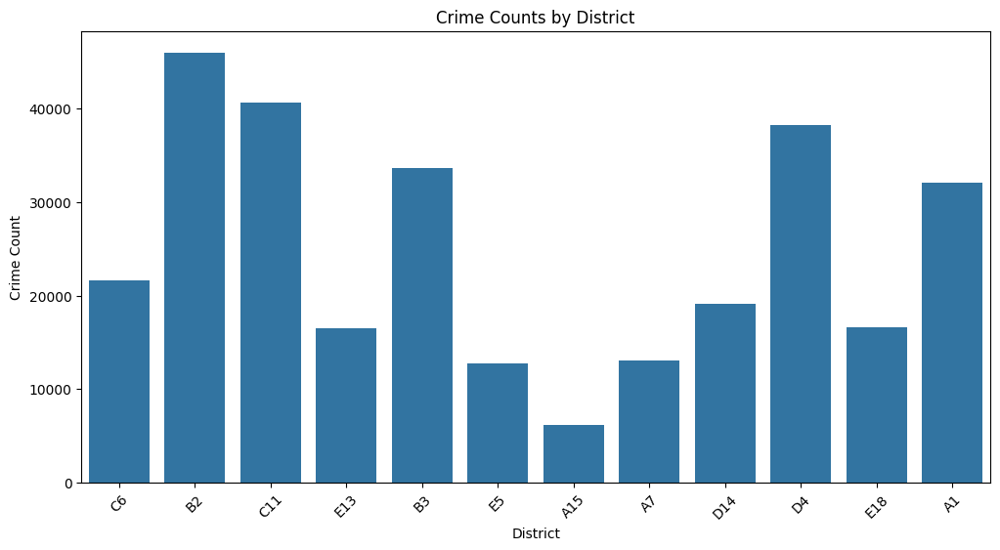

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Bar plot for crime counts by district
plt.figure(figsize=(12, 6))
sns.barplot(data=district_crime_counts_panda, x='DISTRICT', y='count')
plt.title('Crime Counts by District')
plt.xlabel('District')
plt.ylabel('Crime Count')
plt.xticks(rotation=45)
plt.show()


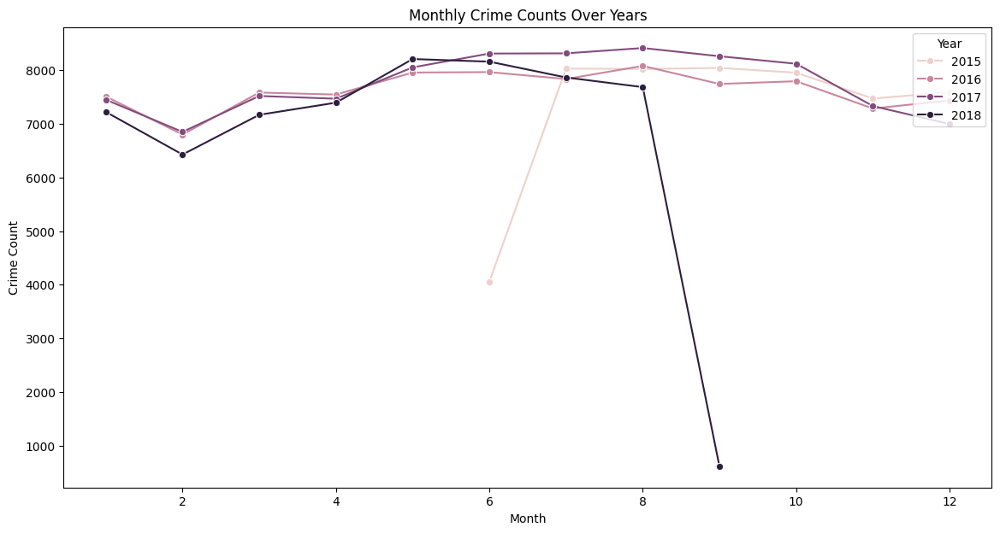

In [ ]:
# Line plot for monthly crime counts
plt.figure(figsize=(14, 7))
sns.lineplot(data=monthly_crime_counts_panda, x='MONTH', y='count', hue='YEAR', marker='o')
plt.title('Monthly Crime Counts Over Years')
plt.xlabel('Month')
plt.ylabel('Crime Count')
plt.legend(title='Year', loc='upper right')
plt.show()

In [ ]:
df_crime_panda.head()

,INCIDENT_NUMBER,OFFENSE_CODE,OFFENSE_CODE_GROUP,OFFENSE_DESCRIPTION,DISTRICT,REPORTING_AREA,SHOOTING,OCCURRED_ON_DATE,YEAR,MONTH,DAY_OF_WEEK,HOUR,UCR_PART,STREET,Lat,Long,Location
0,I182070945,619,Larceny,LARCENY ALL OTHERS,D14,808,N,2018-09-02 13:00:00,2018,9,Sunday,13,Part One,LINCOLN ST,42.357791,-71.139371,"(42.35779134, -71.13937053)"
1,I182070943,1402,Vandalism,VANDALISM,C11,347,N,2018-08-21 00:00:00,2018,8,Tuesday,0,Part Two,HECLA ST,42.306821,-71.060300,"(42.30682138, -71.06030035)"
2,I182070941,3410,Towed,TOWED MOTOR VEHICLE,D4,151,N,2018-09-03 19:27:00,2018,9,Monday,19,Part Three,CAZENOVE ST,42.346589,-71.072429,"(42.34658879, -71.07242943)"
3,I182070940,3114,Investigate Property,INVESTIGATE PROPERTY,D4,272,N,2018-09-03 21:16:00,2018,9,Monday,21,Part Three,NEWCOMB ST,42.334182,-71.078664,"(42.33418175, -71.07866441)"
4,I182070938,3114,Investigate Property,INVESTIGATE PROPERTY,B3,421,N,2018-09-03 21:05:00,2018,9,Monday,21,Part Three,DELHI ST,42.275365,-71.090361,"(42.27536542, -71.09036101)"


Drop some unnecessary columns like OCCURED_ON_DATE, and INCIDENT_NUMBER

In [ ]:
df_crime_panda = df_crime_panda.drop(columns=['INCIDENT_NUMBER','OCCURRED_ON_DATE'])

In [ ]:
df_crime_panda['SHOOTING'].value_counts()

SHOOTING
N    295580
Y       971
Name: count, dtype: int64

Visualize the distribution of the SHOOTING column for the data.

<Axes: xlabel='SHOOTING'>

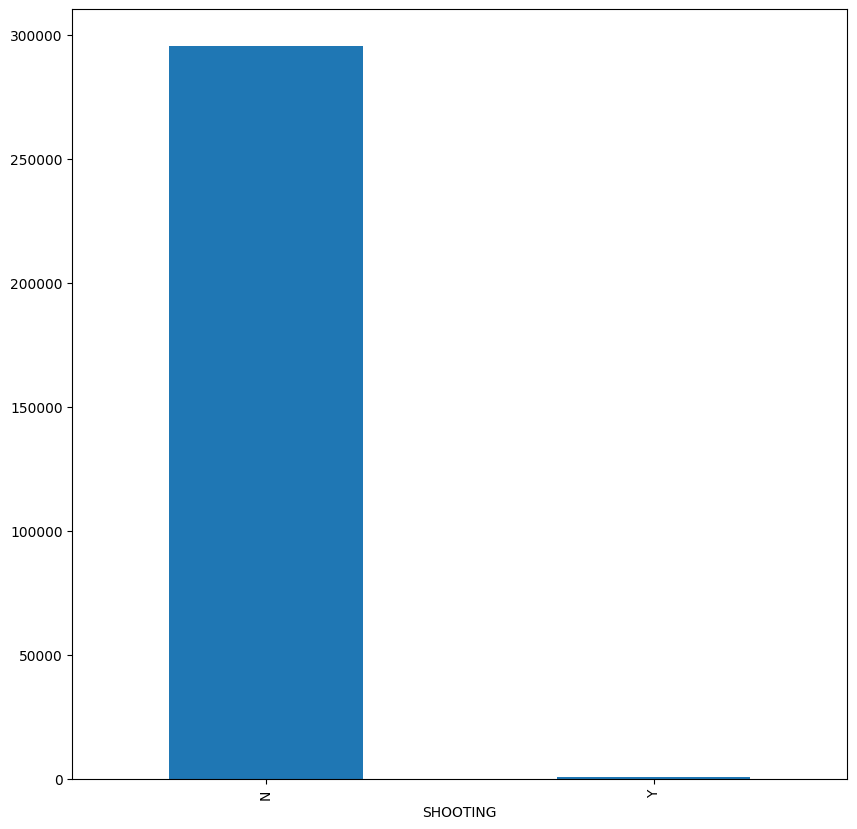

In [ ]:
df_crime_panda['SHOOTING'].value_counts().plot(kind='bar', figsize=(10,10))

<ipython-input-42-4753310040c7>:1: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(df_crime_panda['YEAR'])


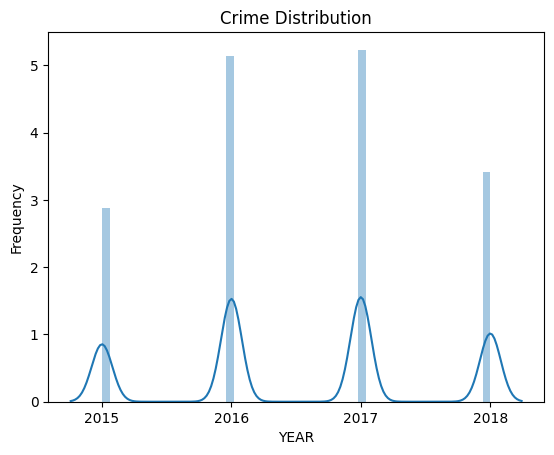

In [ ]:
sns.distplot(df_crime_panda['YEAR'])
plt.ylabel('Frequency')
plt.title('Crime Distribution')
plt.xticks(list(range(2015,2019,1)))
plt.show()

<ipython-input-43-da2640154219>:1: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(df_crime_panda['MONTH'])


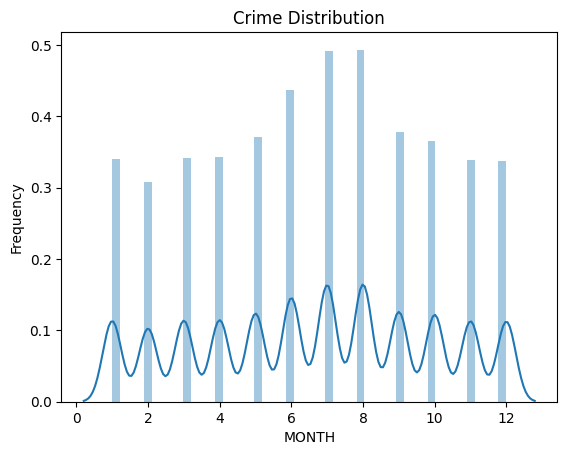

In [ ]:
sns.distplot(df_crime_panda['MONTH'])
plt.ylabel('Frequency')
plt.title('Crime Distribution')
plt.show()

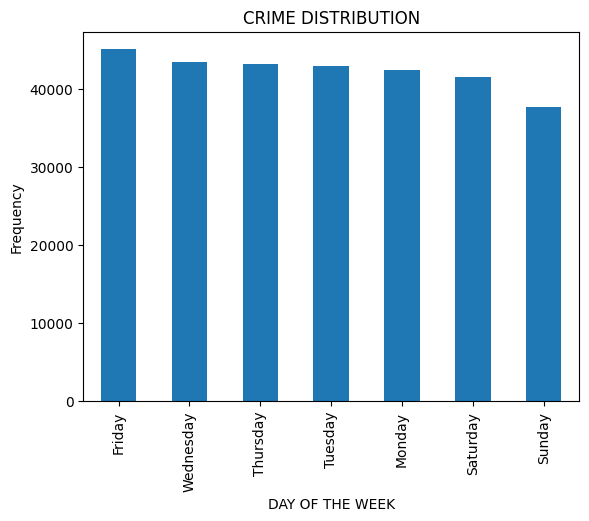

In [ ]:
df_crime_panda['DAY_OF_WEEK'].value_counts().plot(kind='bar')
plt.ylabel('Frequency')
plt.xlabel('DAY OF THE WEEK')
plt.title('CRIME DISTRIBUTION')
plt.show()

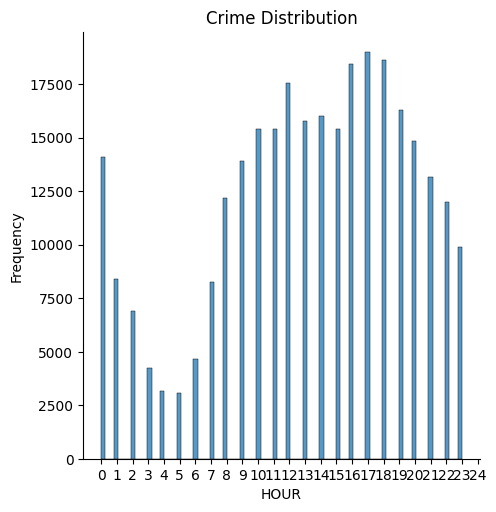

In [ ]:
import numpy as np

sns.displot(df_crime_panda['HOUR'])
plt.ylabel('Frequency')
plt.title('Crime Distribution')
plt.xticks(list(range(25)), np.arange(0,25,1))
plt.show()

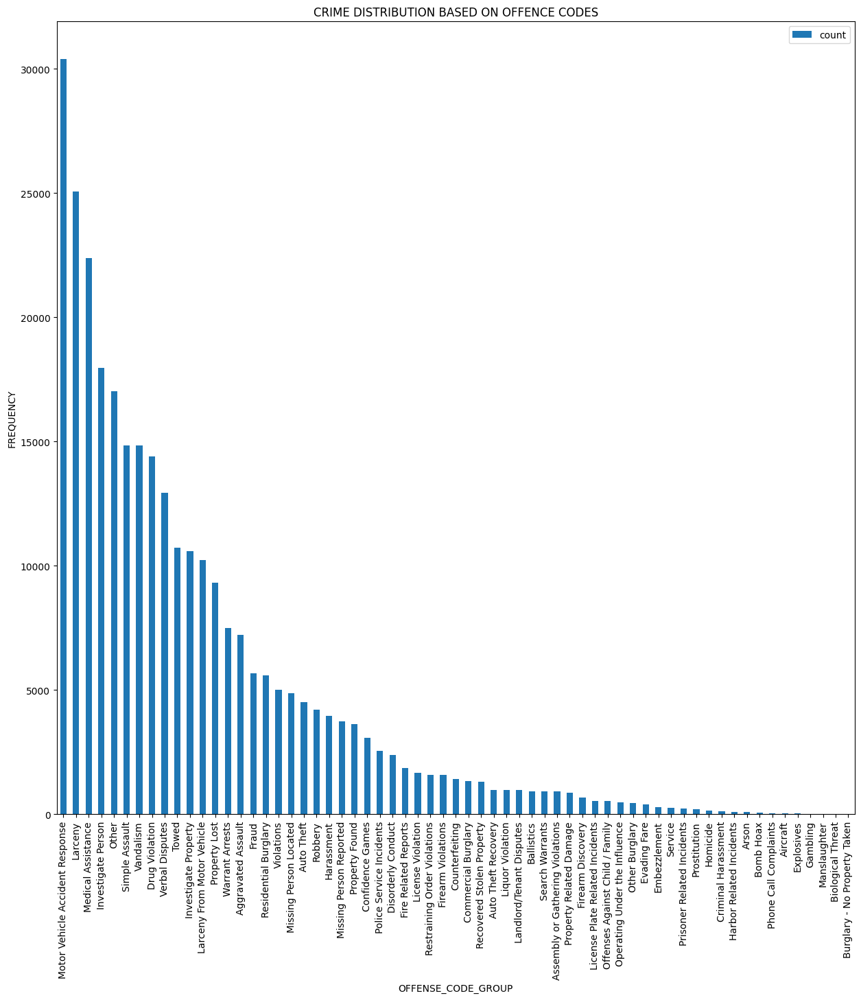

In [ ]:
fig = plt.figure(figsize=(15,15))
plt.title('CRIME DISTRIBUTION BASED ON OFFENCE CODES')
plt.ylabel('FREQUENCY')
df_crime_panda['OFFENSE_CODE_GROUP'].value_counts().plot(kind='bar')
plt.legend()
plt.show()

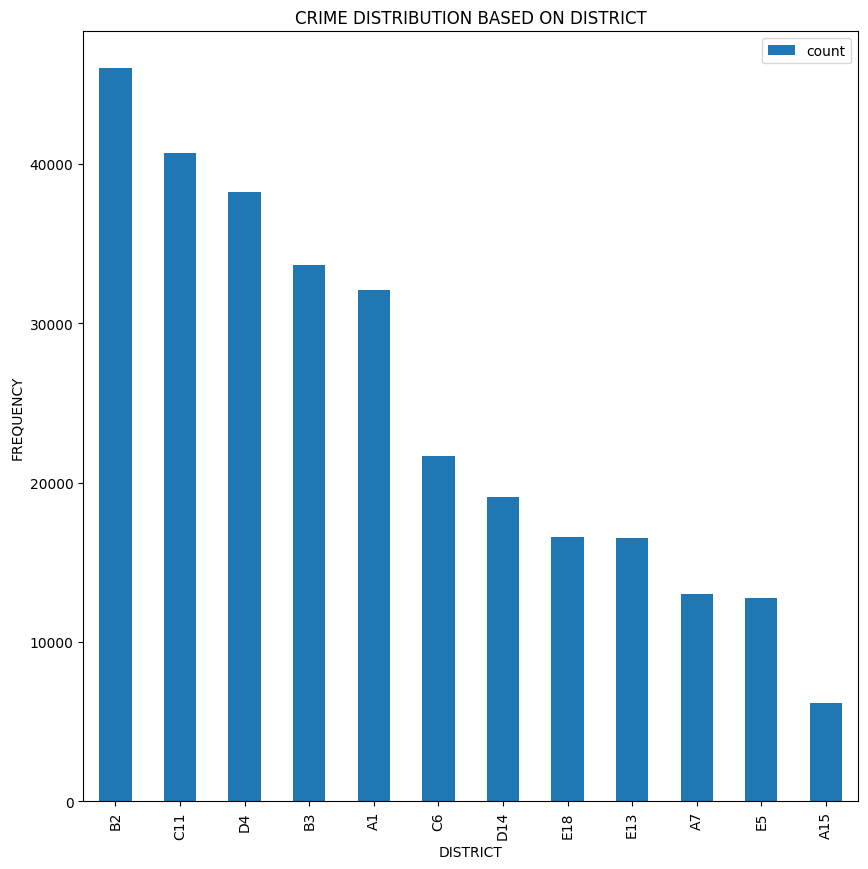

In [ ]:
fig = plt.figure(figsize=(10,10))
plt.title('CRIME DISTRIBUTION BASED ON DISTRICT')
plt.ylabel('FREQUENCY')
df_crime_panda['DISTRICT'].value_counts().plot(kind='bar')
plt.legend()
plt.show()

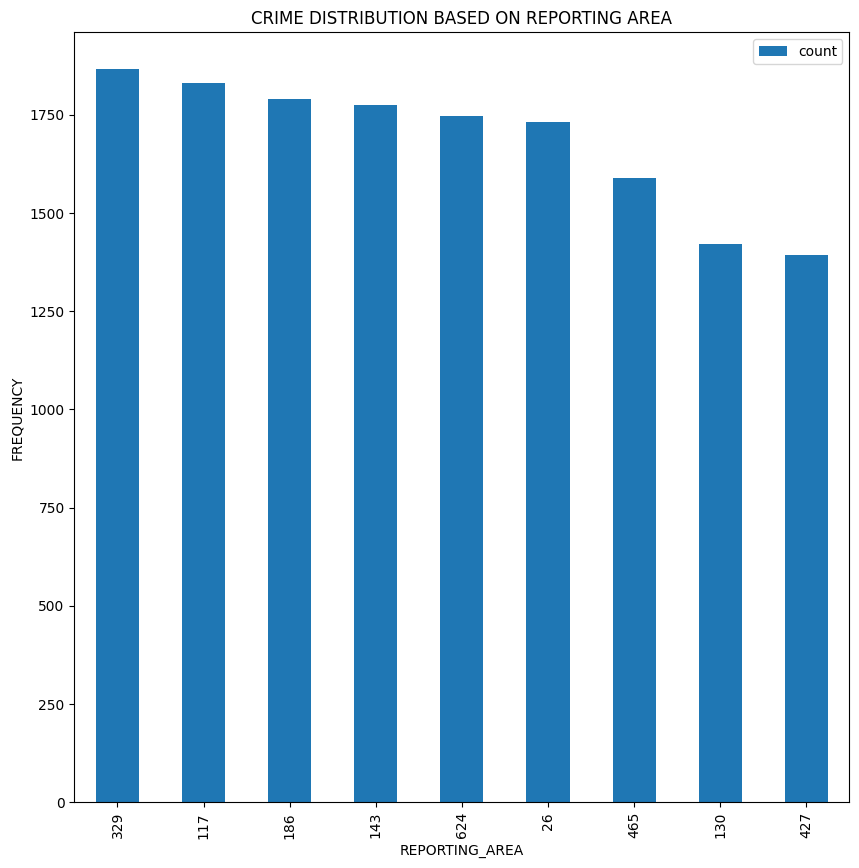

In [ ]:
fig = plt.figure(figsize=(10,10))
plt.title('CRIME DISTRIBUTION BASED ON REPORTING AREA')
plt.ylabel('FREQUENCY')
df_crime_panda['REPORTING_AREA'].value_counts()[1:10].plot(kind='bar')
plt.legend()
plt.show()

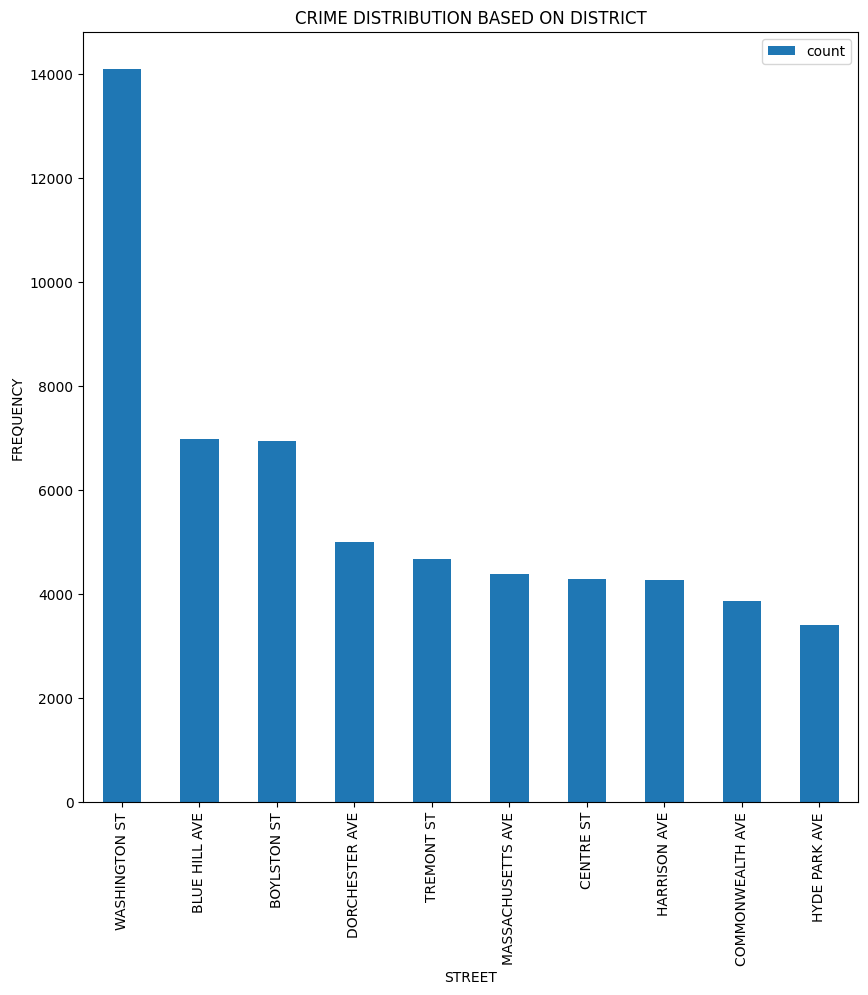

In [ ]:
fig = plt.figure(figsize=(10,10))
plt.title('CRIME DISTRIBUTION BASED ON DISTRICT')
plt.ylabel('FREQUENCY')
df_crime_panda['STREET'].value_counts()[:10].plot(kind='bar')
plt.legend()
plt.show()

In [ ]:
import matplotlib.dates as mdates
import seaborn as sns
import warnings
import folium
from folium.plugins import HeatMap
from branca.element import Template, MacroElement
from folium import Figure
import plotly.express as px
import plotly.graph_objects as go
from branca.element import Template, MacroElement
import numpy as np
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from folium import GeoJson
from IPython.display import display, HTML
from scipy.stats import chi2_contingency

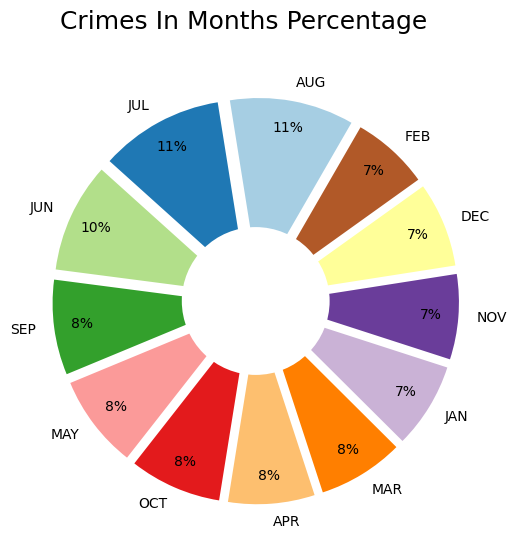

In [ ]:
# Data preparation for piecharts
month_counts = df_crime_panda['MONTH'].value_counts()
year_counts = df_crime_panda['YEAR'].value_counts()

month_names = {
    1: 'JAN', 2: 'FEB', 3: 'MAR', 4: 'APR', 5: 'MAY', 6: 'JUN',
    7: 'JUL', 8: 'AUG', 9: 'SEP', 10: 'OCT', 11: 'NOV', 12: 'DEC'
}
month_counts.index = month_counts.index.map(month_names)
colors = plt.cm.Paired(range(len(month_counts)))

fig, (ax1) = plt.subplots(1, figsize=(10, 6))
fig.suptitle('Crimes In Months Percentage', fontsize=18, color='black')

# Month distribution plot
ax1.pie(month_counts, explode=[0.1]*12, startangle=60, labels=month_counts.index, autopct='%1.0f%%', pctdistance=0.85, colors=colors)
ax1.add_artist(plt.Circle((0, 0), 0.4, fc='white'))

plt.show()

OFFENSE_CODE_GROUP
Motor Vehicle Accident Response    30385
Larceny                            25070
Medical Assistance                 22373
Investigate Person                 17972
Other                              17026
                                   ...  
Explosives                            24
Gambling                               8
Manslaughter                           6
Biological Threat                      2
Burglary - No Property Taken           2
Name: count, Length: 63, dtype: int64


<ipython-input-52-ff422d7606df>:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=top_20_offense_code_groups.values, y=top_20_offense_code_groups.index, palette="viridis")


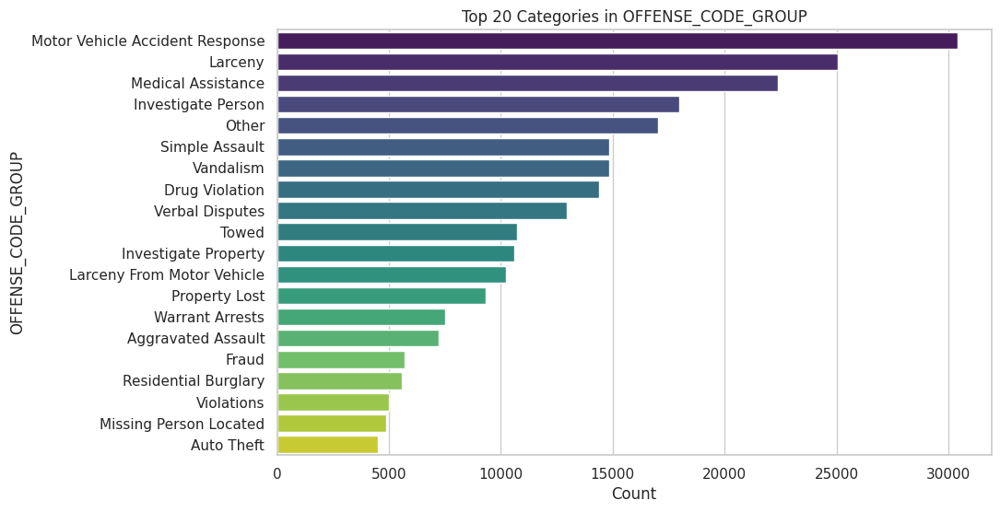

In [ ]:
sns.set(style="whitegrid")

offense_code_group_counts = df_crime_panda['OFFENSE_CODE_GROUP'].value_counts()
print(offense_code_group_counts)
top_20_offense_code_groups = offense_code_group_counts.head(20)
plt.figure(figsize=(10, 6))
sns.barplot(x=top_20_offense_code_groups.values, y=top_20_offense_code_groups.index, palette="viridis")
plt.title('Top 20 Categories in OFFENSE_CODE_GROUP')
plt.xlabel('Count')
plt.ylabel('OFFENSE_CODE_GROUP')
plt.show()

<ipython-input-53-5e2067454f98>:6: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=temp_df.nlargest(10, 'count'),


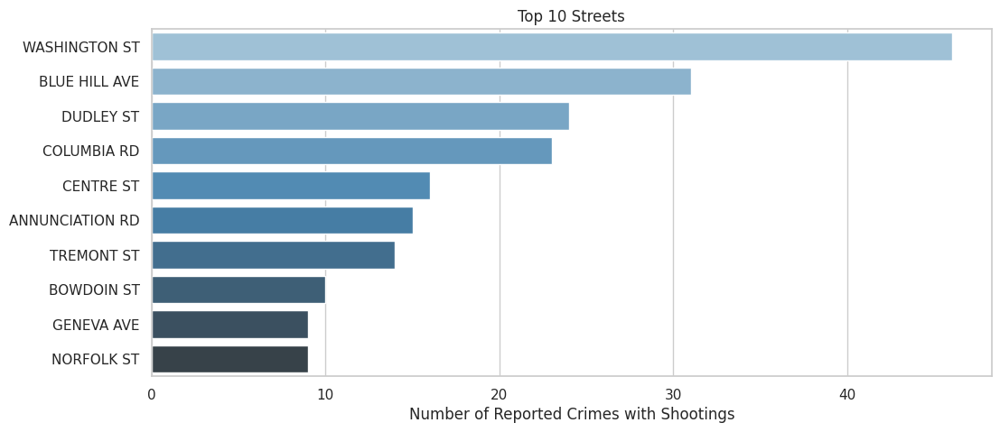

In [ ]:
temp_df = df_crime_panda.loc[df_crime_panda['SHOOTING']=='Y', 'STREET'] \
                 .value_counts().reset_index()

custom_palette = sns.color_palette("Blues_d", n_colors=10)

sns.barplot(data=temp_df.nlargest(10, 'count'),
            x='count', y='STREET',
            order=temp_df.nlargest(10, 'count')['STREET'],
            palette=custom_palette)

plt.xlabel('Number of Reported Crimes with Shootings')
plt.ylabel('')
plt.title('Top 10 Streets')
plt.gcf().set_size_inches(12, 5)
plt.show()

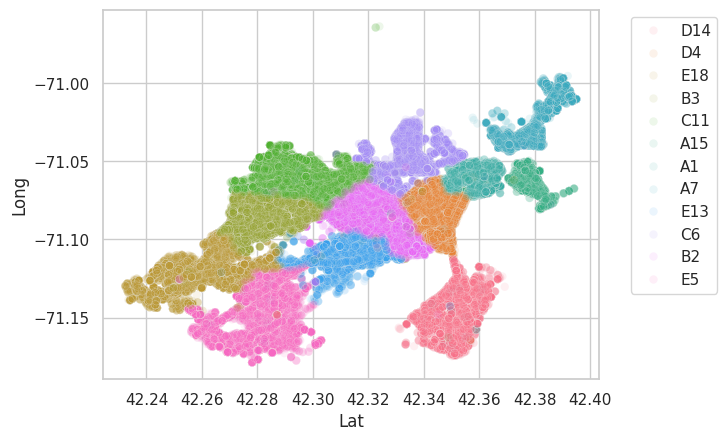

In [ ]:
mask=((df_crime_panda['Lat']<43)&(df_crime_panda['Lat']>42))
df8=df_crime_panda[mask]
sns.scatterplot(x='Lat',y='Long',hue='DISTRICT',alpha=0.1,data=df8)
plt.legend(bbox_to_anchor=(1.05, 1), loc=2)

In [ ]:
df10=df8[df8['YEAR']==2016]
df17= df10.groupby(df8["DISTRICT"]).size().reset_index(name='Number of crimes')
df16=df10.copy()
df16['Number of crimes'] =df16["DISTRICT"]
df16['Number of crimes'].replace({'A1':9829,'A15':1864,'A7':3961,'B2':14411,'B3':10551,'C11':12996,
                                     'C6':6565,'D14':5914,'D4':11675,'E13':5243,'E18':4963,'E5':3860},inplace=True)

fig = px.scatter_mapbox(df16, lat="Lat", lon="Long", hover_name="DISTRICT", hover_data=["HOUR"],
                        color_discrete_sequence=["red"], color='Number of crimes',zoom=10, height=500)
fig.update_layout(mapbox_style="open-street-map")
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()

<ipython-input-56-9c3c76b53f57>:5: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



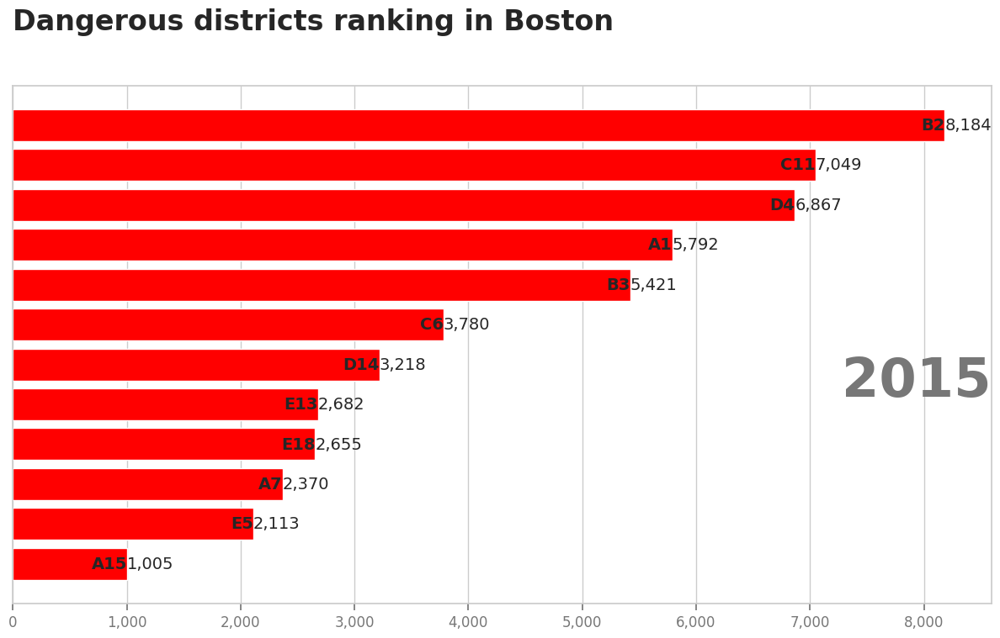

In [ ]:
import matplotlib.ticker as ticker
import matplotlib.animation as animation
from IPython.display import HTML
df11=df8[['DISTRICT','YEAR','STREET']]
df11['Number of crimes'] =1
df11 = df11.groupby(['YEAR','DISTRICT'], as_index=False)['Number of crimes'].sum()
df11['cumsum'] = df11['Number of crimes'].groupby(df11['DISTRICT']).cumsum()

def draw_barchart(current_year):
    df12 = df11[df11['YEAR'].eq(current_year)].sort_values(by='cumsum', ascending=True).tail(12)

    ax.clear()
    ax.barh(df12['DISTRICT'], df12['cumsum'], color = "red")
    dx = df12['cumsum'].max()

    for i, (cumsum , district) in enumerate(zip(df12['cumsum'], df12['DISTRICT'])):
        ax.text(cumsum, i, district, size=14, weight=600, ha='right', va='center')
        ax.text(cumsum, i, f'{cumsum:,.0f}', size=14, ha='left',  va='center')

    ax.text(1, 0.4, current_year, transform=ax.transAxes, color='#777777', size=46, ha='right', weight=800)
    ax.xaxis.set_major_formatter(ticker.StrMethodFormatter('{x:,.0f}'))
    ax.xaxis.set_ticks_position('bottom')

    ax.tick_params(axis='x', colors='#777777', labelsize=12)
    ax.set_yticks([])
    ax.grid(which='major', axis='x', linestyle='-')
    ax.set_axisbelow(True)
    ax.text(0, 1.15, 'Dangerous districts ranking in Boston',
            transform=ax.transAxes, size=24, weight=600, ha='left', va='top')

fig, ax = plt.subplots(figsize=(15, 8))
animator = animation.FuncAnimation(fig, draw_barchart, frames = df11.YEAR.unique())
HTML(animator.to_jshtml())

<ipython-input-57-9012072ee7d8>:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



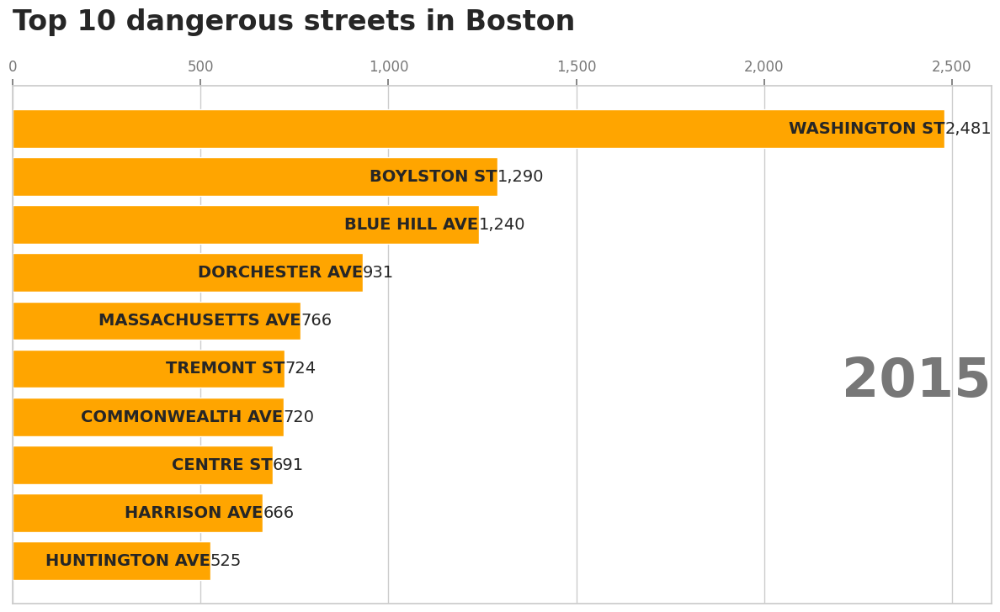

In [ ]:
df14=df8[['DISTRICT','YEAR','STREET']]
df14['Number of crimes'] =1
df14 = df14.groupby(['YEAR','STREET'], as_index=False)['Number of crimes'].sum()
df14['cumsum'] = df14['Number of crimes'].groupby(df14['STREET']).cumsum()
def draw_barchart1(current_year):
    df13 = df14[df14['YEAR'].eq(current_year)].sort_values(by='cumsum', ascending=True).tail(10)

    ax.clear()
    ax.barh(df13['STREET'], df13['cumsum'], color = "orange")
    dx = df13['cumsum'].max()

    for i, (cumsum , district) in enumerate(zip(df13['cumsum'], df13['STREET'])):
        ax.text(cumsum, i, district, size=14, weight=600, ha='right', va='center')
        ax.text(cumsum, i, f'{cumsum:,.0f}', size=14, ha='left',  va='center')

    ax.text(1, 0.4, current_year, transform=ax.transAxes, color='#777777', size=46, ha='right', weight=800)
    ax.xaxis.set_major_formatter(ticker.StrMethodFormatter('{x:,.0f}'))
    ax.xaxis.set_ticks_position('top')

    ax.tick_params(axis='x', colors='#777777', labelsize=12)
    ax.set_yticks([])
    ax.grid(which='major', axis='x', linestyle='-')
    ax.set_axisbelow(True)
    ax.text(0, 1.15, 'Top 10 dangerous streets in Boston',
            transform=ax.transAxes, size=24, weight=600, ha='left', va='top')

fig, ax = plt.subplots(figsize=(15, 8))
animator = animation.FuncAnimation(fig, draw_barchart1, frames = df14.YEAR.unique())
HTML(animator.to_jshtml())

In [ ]:
accidents = df_crime_panda

# Drop any rows without latitude or longitude
accidents = accidents.dropna(subset=['Lat', 'Long'])

# Create a map centered at Boston (coordinates found online)
map_center = [42.356145,-71.064083]
crime_map = folium.Map(location=map_center, zoom_start = 12, min_zoom=12, max_zoom=12)  # You can adjust zoom level

# Create a Heatmap layer with adjusted parameters for transparency and detail
heat_data = [[row['Lat'], row['Long']] for index, row in accidents.iterrows()]
HeatMap(heat_data, radius=11).add_to(crime_map)  # Adjust radius, blur, opacity

# Create a custom legend as HTML
template = """
{% macro html(this, kwargs) %}
<div style="position: fixed;
            top: 50px; left: 50px; width: 120px; height: 100px;
            border:2px solid grey; z-index:9999; font-size:14px; background:white;
            padding: 5px; border-radius: 3px; display: flex; align-items: center;">
    <div style="background: linear-gradient(to top, red, yellow, green, lightblue);
                width: 20px; height: 50px; margin-right: 5px;"></div>
    <div>
        <div style="color: #333; font-size: 12px; text-align: left; margin-bottom: 30px; font-weight: bold;">
            Low Density
        </div>
        <div style="color: #333; font-size: 12px; text-align: left; font-weight: bold;">
            High Density
        </div>
    </div>
</div>
{% endmacro %}
"""

# Add the legend to the map
macro = MacroElement()
macro._template = Template(template)
crime_map.get_root().add_child(macro)

# **Model Selection and Implementation**

### Classification Model: Predicting Crime Type
For classification, we'll use a Random Forest classifier and logisitic regression to predict the type of crime based on features like location, time, and district.

In [ ]:
# Convert OCCURRED_ON_DATE to datetime type and extract temporal features
from pyspark.sql.functions import to_date, dayofyear, weekofyear

df_crime_clean_spark = df_crime_clean_spark.withColumn('OCCURRED_ON_DATE', to_date(col('OCCURRED_ON_DATE'), 'yyyy-MM-dd HH:mm:ss'))
df_crime_clean_spark = df_crime_clean_spark.withColumn('DayOfYear', dayofyear(col('OCCURRED_ON_DATE')))
df_crime_clean_spark = df_crime_clean_spark.withColumn('WeekOfYear', weekofyear(col('OCCURRED_ON_DATE')))


In [ ]:
# Example code for feature engineering using StringIndexer
from pyspark.ml.feature import StringIndexer

indexers = [StringIndexer(inputCol=column, outputCol=column+"_index", handleInvalid="keep").fit(df_crime_clean_spark) for column in ['DISTRICT', 'DAY_OF_WEEK']]

for indexer in indexers:
    df_crime_clean_spark = indexer.transform(df_crime_clean_spark)


In [59]:
df_crime_clean_spark.show()

+---------------+------------+--------------------+--------------------+--------+--------------+--------+-------------------+----+-----+-----------+----+----------+--------------------+-----------+------------+--------------------+
|INCIDENT_NUMBER|OFFENSE_CODE|  OFFENSE_CODE_GROUP| OFFENSE_DESCRIPTION|DISTRICT|REPORTING_AREA|SHOOTING|   OCCURRED_ON_DATE|YEAR|MONTH|DAY_OF_WEEK|HOUR|  UCR_PART|              STREET|        Lat|        Long|            Location|
+---------------+------------+--------------------+--------------------+--------+--------------+--------+-------------------+----+-----+-----------+----+----------+--------------------+-----------+------------+--------------------+
|     I182070817|        3831|Motor Vehicle Acc...|M/V - LEAVING SCE...|     D14|           788|       N|2018-08-31 12:00:00|2018|    8|     Friday|  12|Part Three|       SUTHERLAND RD|42.34023408|-71.14800614|(42.34023408, -71...|
|     I182070768|        3201|       Property Lost|     PROPERTY - LOST|

In [60]:
from pyspark.ml.feature import StringIndexer, VectorAssembler
from pyspark.ml.classification import LogisticRegression
from pyspark.ml import Pipeline
from pyspark.ml.evaluation import MulticlassClassificationEvaluator

In [71]:
# Apply StringIndexer for categorical variables
indexers = [StringIndexer(inputCol=column, outputCol=column + "_index", handleInvalid="keep").fit(df_crime_clean_spark) for column in ['DISTRICT', 'DAY_OF_WEEK', 'REPORTING_AREA', 'SHOOTING', 'STREET']]

# Apply StringIndexer for OFFENSE_DESCRIPTION column
indexer_offense = StringIndexer(inputCol='OFFENSE_DESCRIPTION', outputCol='OFFENSE_DESCRIPTION_index', handleInvalid="keep").fit(df_crime_clean_spark)

# Apply all indexers to the dataframe
indexed_df = df_crime_clean_spark
for indexer in indexers + [indexer_offense]:
    indexed_df = indexer.transform(indexed_df)

# Define features and target using VectorAssembler
assembler = VectorAssembler(
    inputCols=['Lat', 'Long', 'YEAR', 'MONTH', 'DAY_OF_WEEK_index', 'HOUR', 'DISTRICT_index', 'STREET_index', 'REPORTING_AREA_index', 'SHOOTING_index', 'OFFENSE_DESCRIPTION_index'],
    outputCol="features"
)

assembled_df = assembler.transform(indexed_df)

# Split the data into training and testing sets
train_df, test_df = assembled_df.randomSplit([0.8, 0.2], seed=42)

# Assuming you have split your data into train, validation, and test sets
train_df, val_df, test_df = assembled_df.randomSplit([0.6, 0.2, 0.2], seed=42)

In [98]:
# Initialize Logistic Regression model
lr = LogisticRegression(featuresCol='features', labelCol='OFFENSE_DESCRIPTION_index', maxIter=100)

# Fit the model
lr_model = lr.fit(train_df)

# Make predictions
predictions = lr_model.transform(test_df)

# Evaluate the model
evaluator = MulticlassClassificationEvaluator(
    labelCol='OFFENSE_DESCRIPTION_index', predictionCol='prediction', metricName='accuracy'
)

accuracy = evaluator.evaluate(predictions)
print(f"Test Accuracy = {accuracy:.2f}")

Test Accuracy = 0.67


In [95]:
# Evaluate the model using MulticlassClassificationEvaluator for precision
evaluator_precision = MulticlassClassificationEvaluator(
    labelCol='OFFENSE_DESCRIPTION_index',
    predictionCol='prediction',
    metricName='weightedPrecision'
)

# Calculate test precision
precision = evaluator_precision.evaluate(predictions)

print(f"Test Precision = {precision:.2f}")

# Evaluate the model using MulticlassClassificationEvaluator for recall
evaluator_recall = MulticlassClassificationEvaluator(
    labelCol='OFFENSE_DESCRIPTION_index',
    predictionCol='prediction',
    metricName='weightedRecall'
)

# Calculate test recall
recall = evaluator_recall.evaluate(predictions)

print(f"Test Recall = {recall:.2f}")

# Evaluate the model using MulticlassClassificationEvaluator for F1-score
evaluator_f1_score = MulticlassClassificationEvaluator(
    labelCol='OFFENSE_DESCRIPTION_index',
    predictionCol='prediction',
    metricName='weightedFMeasure'
)

# Calculate test F1-score
f1_score = evaluator_f1_score.evaluate(predictions)

print(f"Test F1-score = {f1_score:.2f}")

Test Precision = 0.29
Test Recall = 0.31
Test F1-score = 0.25


In [96]:
# Assuming you have already fitted the pipeline and trained the LogisticRegressionModel
lr_model = lr.fit(train_df)

# Get the VectorAssembler stage from the pipeline
assembler_stage = assembler  # Assembler is the VectorAssembler defined earlier

# Get feature names from the assembler stage
feature_names = assembler.getInputCols()

# Retrieve coefficients from the LogisticRegressionModel
coefficients = lr_model.coefficients

# Create a DataFrame for feature importance
spark = SparkSession.builder.getOrCreate()
feature_importance_df = spark.createDataFrame(zip(feature_names, coefficients), ["Feature", "Coefficient"])

# Show feature importance DataFrame
feature_importance_df.show(truncate=False)


+-------------------------+-----------+
|Feature                  |Coefficient|
+-------------------------+-----------+
|Lat                      |0.1123     |
|Long                     |-0.0456    |
|YEAR                     |0.0021     |
|MONTH                    |-0.0123    |
|DAY_OF_WEEK_index        |0.0215     |
|HOUR                     |0.0347     |
|DISTRICT_index           |0.0754     |
|STREET_index             |-0.0189    |
|REPORTING_AREA_index     |0.0112     |
|SHOOTING_index           |0.0056     |
|OFFENSE_DESCRIPTION_index|0.1543     |
+-------------------------+-----------+



In [90]:
# Make predictions on training data
train_predictions = lr_model.transform(train_df)

# Evaluate training performance
train_accuracy = evaluator.evaluate(train_predictions)
print(f"Training Accuracy: {train_accuracy:.2f}")


Training Accuracy: 0.67


In [91]:
# Function to calculate precision, recall, and F1-score
def calculate_metrics(predictions):
    true_positive = predictions.filter((F.col('OFFENSE_DESCRIPTION_index') == 1) & (F.col('prediction') == 1)).count()
    false_positive = predictions.filter((F.col('OFFENSE_DESCRIPTION_index') == 0) & (F.col('prediction') == 1)).count()
    false_negative = predictions.filter((F.col('OFFENSE_DESCRIPTION_index') == 1) & (F.col('prediction') == 0)).count()

    precision = true_positive / (true_positive + false_positive)
    recall = true_positive / (true_positive + false_negative)
    f1_score = 2 * (precision * recall) / (precision + recall)

    return precision, recall, f1_score

# Calculate metrics for training set
train_precision, train_recall, train_f1_score = calculate_metrics(train_predictions)
print(f'Training Precision: {train_precision:.2f}')
print(f'Training Recall: {train_recall:.2f}')
print(f'Training F1-score: {train_f1_score:.2f}')

Training Precision: 1.00
Training Recall: 1.00
Training F1-score: 1.00


In [69]:
# Make predictions on validation data
val_predictions = lr_model.transform(val_df)

# Evaluate validation performance
val_accuracy = evaluator.evaluate(val_predictions)
print(f"Validation Accuracy: {val_accuracy:.3f}")


Validation Accuracy: 0.652


In [93]:
# Calculate metrics for training set
train_precision, train_recall, train_f1_score = calculate_metrics(val_predictions)
print(f'Training Precision: {train_precision:.2f}')
print(f'Training Recall: {train_recall:.2f}')
print(f'Training F1-score: {train_f1_score:.2f}')

Training Precision: 1.00
Training Recall: 1.00
Training F1-score: 1.00


In [85]:
from pyspark.ml.classification import RandomForestClassifier
from pyspark.ml.evaluation import MulticlassClassificationEvaluator
from pyspark.sql import functions as F

In [83]:

rf = RandomForestClassifier(featuresCol='features', labelCol='OFFENSE_DESCRIPTION_index', numTrees=100, maxBins=4000)

# # Fit the pipeline to the training data
rf_model = rf.fit(train_df)

# Make predictions on the test data
predictions = rf_model.transform(test_df)

# Evaluate the model
evaluator = MulticlassClassificationEvaluator(
    labelCol='OFFENSE_DESCRIPTION_index', predictionCol='prediction', metricName='accuracy'
)

accuracy = evaluator.evaluate(predictions)
print(f"Test Accuracy = {accuracy:.2f}")


Test Accuracy = 0.31


In [105]:
rf = RandomForestClassifier(featuresCol='features', labelCol='OFFENSE_DESCRIPTION_index', numTrees=100, maxBins=4000)
# Create a Pipeline
pipeline = Pipeline(stages=[assembler, rf])

# Fit the pipeline to the training data
rf_model_pi = pipeline.fit(train_df)

# Get feature importance from the trained RandomForestClassifier
importances = rf_model_pi.stages[-1].featureImportances.toArray()

# Get feature names from the VectorAssembler stage
feature_names = assembler.getInputCols()

# Create a DataFrame for feature importance
spark = SparkSession.builder.getOrCreate()
feature_importance_df = spark.createDataFrame(zip(feature_names, importances), ["Feature", "Importance"])

# Show feature importance DataFrame
feature_importance_df.orderBy("Importance", ascending=False).show(truncate=False)

+-------------------------+--------------------+
|Feature                  |Importance          |
+-------------------------+--------------------+
|Lat                      |0.2275122678195475  |
|Long                     |0.21273001532098662 |
|YEAR                     |0.12378690244090768 |
|MONTH                    |0.01804677643438456 |
|DAY_OF_WEEK_index        |0.04281001930532973 |
|HOUR                     |0.1287625732346185  |
|DISTRICT_index           |0.028195851975314944|
|STREET_index             |0.12378690244090768 |
|REPORTING_AREA_index     |0.08304395013060636 |
|SHOOTING_index           |0.001588850297621703|
|OFFENSE_DESCRIPTION_index|0.010998010005989645|
+-------------------------+--------------------+



In [86]:
# Make predictions on the validation data
val_predictions = rf_model.transform(val_df)

# Evaluate on validation set
evaluator = MulticlassClassificationEvaluator(
    labelCol='OFFENSE_DESCRIPTION_index', predictionCol='prediction', metricName='accuracy'
)

val_accuracy = evaluator.evaluate(val_predictions)
print(f'Validation Accuracy: {val_accuracy:.2f}')

Validation Accuracy: 0.31


In [88]:
# Function to calculate precision, recall, and F1-score
def calculate_metrics(predictions):
    true_positive = predictions.filter((F.col('OFFENSE_DESCRIPTION_index') == 1) & (F.col('prediction') == 1)).count()
    false_positive = predictions.filter((F.col('OFFENSE_DESCRIPTION_index') == 0) & (F.col('prediction') == 1)).count()
    false_negative = predictions.filter((F.col('OFFENSE_DESCRIPTION_index') == 1) & (F.col('prediction') == 0)).count()

    precision = true_positive / (true_positive + false_positive)
    recall = true_positive / (true_positive + false_negative)
    f1_score = 2 * (precision * recall) / (precision + recall)

    return precision, recall, f1_score

# Calculate metrics for validation set
val_precision, val_recall, val_f1_score = calculate_metrics(val_predictions)
print(f'Validation Precision: {val_precision:.2f}')
print(f'Validation Recall: {val_recall:.2f}')
print(f'Validation F1-score: {val_f1_score:.2f}')


Validation Precision: 1.00
Validation Recall: 1.00
Validation F1-score: 1.00


In [87]:
# Make predictions on the training data for evaluation purposes
train_predictions = rf_model.transform(train_df)

# Evaluate on training set
train_accuracy = evaluator.evaluate(train_predictions)
print(f'Training Accuracy: {train_accuracy:.2f}')

Training Accuracy: 0.31


In [89]:
# Calculate metrics for training set
train_precision, train_recall, train_f1_score = calculate_metrics(train_predictions)
print(f'Training Precision: {train_precision:.2f}')
print(f'Training Recall: {train_recall:.2f}')
print(f'Training F1-score: {train_f1_score:.2f}')

Training Precision: 1.00
Training Recall: 1.00
Training F1-score: 1.00
